In [170]:
t={
    "event_name_1": "category", 
                  "event_name_2": "category", 
                  "event_type_1": "category", 
                  "event_type_2": "category",
                    'wm_yr_wk': 'int16', 
                  "day": "int16",
                  "month": "int16", 
                  "year": "int16", 
                   "snap_CA": "float32", 
                    'item_id':"category",
                    'dept_id':"category",
                'cat_id':"category",
                    'units_sold': "int16",
    "weekday": "category",
    "price":"float32",
    'units_sold_monthly_mean':"float32",
    'overall_units_sold_monthly_mean':'float32'
}

In [171]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn.metrics import mean_squared_error

train = pd.read_csv('train.csv',dtype=t)
valid = pd.read_csv('valid.csv',dtype=t)
test = pd.read_csv('test.csv',dtype=t)

train['date'] = pd.to_datetime(train['date'])
valid['date'] = pd.to_datetime(valid['date'])
test['date'] = pd.to_datetime(test['date'])

train

,item_id,dept_id,cat_id,date,day,month,year,wm_yr_wk,weekday,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,sell_price,units_sold
0,HOBBIES_1_001,HOBBIES_1,HOBBIES,2013-07-13,13,7,2013,11325,Saturday,None,None,None,None,0.0,9.58,0
1,HOBBIES_1_001,HOBBIES_1,HOBBIES,2013-07-14,14,7,2013,11325,Sunday,None,None,None,None,0.0,9.58,0
2,HOBBIES_1_001,HOBBIES_1,HOBBIES,2013-07-15,15,7,2013,11325,Monday,None,None,None,None,0.0,9.58,0
3,HOBBIES_1_001,HOBBIES_1,HOBBIES,2013-07-16,16,7,2013,11325,Tuesday,None,None,None,None,0.0,9.58,0
4,HOBBIES_1_001,HOBBIES_1,HOBBIES,2013-07-17,17,7,2013,11325,Wednesday,None,None,None,None,0.0,9.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130464,HOBBIES_1_104,HOBBIES_1,HOBBIES,2015-12-12,12,12,2015,11546,Saturday,None,None,None,None,0.0,23.98,1
130465,HOBBIES_1_104,HOBBIES_1,HOBBIES,2015-12-13,13,12,2015,11546,Sunday,None,None,None,None,0.0,23.98,0
130466,HOBBIES_1_104,HOBBIES_1,HOBBIES,2015-12-14,14,12,2015,11546,Monday,Chanukah End,Religious,None,None,0.0,23.98,0
130467,HOBBIES_1_104,HOBBIES_1,HOBBIES,2015-12-15,15,12,2015,11546,Tuesday,None,None,None,None,0.0,23.98,0


In [172]:
df=train
for col, colDType in t.items():
    if colDType == "category":
        df[col] = df[col].cat.codes.astype("int16")
        df[col] -= df[col].min()
train=df
train

,item_id,dept_id,cat_id,date,day,month,year,wm_yr_wk,weekday,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,sell_price,units_sold
0,0,0,0,2013-07-13,13,7,2013,11325,2,19,2,3,1,0.0,9.58,0
1,0,0,0,2013-07-14,14,7,2013,11325,3,19,2,3,1,0.0,9.58,0
2,0,0,0,2013-07-15,15,7,2013,11325,1,19,2,3,1,0.0,9.58,0
3,0,0,0,2013-07-16,16,7,2013,11325,5,19,2,3,1,0.0,9.58,0
4,0,0,0,2013-07-17,17,7,2013,11325,6,19,2,3,1,0.0,9.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130464,99,0,0,2015-12-12,12,12,2015,11546,2,19,2,3,1,0.0,23.98,1
130465,99,0,0,2015-12-13,13,12,2015,11546,3,19,2,3,1,0.0,23.98,0
130466,99,0,0,2015-12-14,14,12,2015,11546,1,0,3,3,1,0.0,23.98,0
130467,99,0,0,2015-12-15,15,12,2015,11546,5,19,2,3,1,0.0,23.98,0


In [173]:
train.corr()

,item_id,dept_id,cat_id,day,month,year,wm_yr_wk,weekday,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,sell_price,units_sold
item_id,1.000000,NaN,NaN,-0.000417,-0.001748,-0.008782,-0.009137,0.000117,0.000592,0.000731,-0.000884,-0.000968,0.000474,0.260508,-0.070941
dept_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cat_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,-0.000417,NaN,NaN,1.000000,0.007808,-0.015598,-0.001888,-0.002097,-0.014427,-0.028355,0.022902,0.017709,-0.813221,-0.000205,-0.009466
month,-0.001748,NaN,NaN,0.007808,1.000000,-0.227618,-0.065425,-0.001867,-0.081499,-0.012919,0.009464,0.001855,-0.002471,0.005525,-0.010635
year,-0.008782,NaN,NaN,-0.015598,-0.227618,1.000000,0.982399,0.000903,0.015559,0.001795,0.013927,0.012618,0.010735,0.120556,-0.052770
wm_yr_wk,-0.009137,NaN,NaN,-0.001888,-0.065425,0.982399,1.000000,0.000308,0.004871,0.001137,0.014764,0.012709,0.000959,0.124320,-0.054446
weekday,0.000117,NaN,NaN,-0.002097,-0.001867,0.000903,0.000308,1.000000,-0.023267,0.080492,0.000006,0.000004,-0.000523,-0.000049,-0.026645
event_name_1,0.000592,NaN,NaN,-0.014427,-0.081499,0.015559,0.004871,-0.023267,1.000000,0.162069,-0.058142,-0.081228,-0.028512,-0.001282,0.007676
event_type_1,0.000731,NaN,NaN,-0.028355,-0.012919,0.001795,0.001137,0.080492,0.162069,1.000000,-0.152832,-0.201474,0.042377,-0.000290,0.002441


In [142]:
df=valid
for col, colDType in t.items():
    if colDType == "category":
        df[col] = df[col].cat.codes.astype("int16")
        df[col] -= df[col].min()
valid=df
valid

,item_id,dept_id,cat_id,date,day,month,year,wm_yr_wk,weekday,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,sell_price,units_sold
0,0,0,0,2015-10-27,27,10,2015,11539,5,19,2,0,0,0.0,8.26,0
1,0,0,0,2015-10-28,28,10,2015,11539,6,19,2,0,0,0.0,8.26,1
2,0,0,0,2015-10-29,29,10,2015,11539,4,19,2,0,0,0.0,8.26,0
3,0,0,0,2015-10-30,30,10,2015,11539,0,19,2,0,0,0.0,8.26,2
4,0,0,0,2015-10-31,31,10,2015,11540,2,8,0,0,0,0.0,8.26,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16281,99,0,0,2016-02-28,28,2,2016,11605,3,19,2,0,0,0.0,23.98,0
16282,99,0,0,2016-02-29,29,2,2016,11605,1,19,2,0,0,0.0,23.98,0
16283,99,0,0,2016-03-01,1,3,2016,11605,5,19,2,0,0,1.0,23.98,0
16284,99,0,0,2016-03-02,2,3,2016,11605,6,19,2,0,0,1.0,23.98,1


In [143]:
df=test
for col, colDType in t.items():
    if colDType == "category":
        df[col] = df[col].cat.codes.astype("int16")
        df[col] -= df[col].min()
test=df
test

,item_id,dept_id,cat_id,date,day,month,year,wm_yr_wk,weekday,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,sell_price,units_sold
0,0,0,0,2016-02-08,8,2,2016,11602,1,9,2,0,0,1.0,8.26,2
1,0,0,0,2016-02-09,9,2,2016,11602,5,9,2,0,0,1.0,8.26,2
2,0,0,0,2016-02-10,10,2,2016,11602,6,4,3,0,0,1.0,8.26,0
3,0,0,0,2016-02-11,11,2,2016,11602,4,9,2,0,0,0.0,8.26,0
4,0,0,0,2016-02-12,12,2,2016,11602,0,9,2,0,0,0.0,8.26,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16400,99,0,0,2016-05-18,18,5,2016,11616,6,9,2,0,0,0.0,23.98,0
16401,99,0,0,2016-05-19,19,5,2016,11616,4,9,2,0,0,0.0,23.98,2
16402,99,0,0,2016-05-20,20,5,2016,11616,0,9,2,0,0,0.0,23.98,0
16403,99,0,0,2016-05-21,21,5,2016,11617,2,9,2,0,0,0.0,23.98,1


In [144]:


train = train.groupby(['item_id','wm_yr_wk'] , as_index= False).agg({'sell_price':'mean','units_sold':'sum'})
train = train.rename(columns={'sell_price':'avg_sell_price'})

valid = valid.groupby(['item_id','wm_yr_wk'] ,as_index= False).agg({'sell_price':'mean','units_sold':'sum'})
valid = valid.rename(columns={'sell_price':'avg_sell_price'})

test= test.groupby(['item_id','wm_yr_wk'], as_index= False).agg({'sell_price':'mean','units_sold':'sum'})
test = test.rename(columns={'sell_price':'avg_sell_price'})


In [145]:
train


,item_id,wm_yr_wk,avg_sell_price,units_sold
0,0,11325,9.58,1
1,0,11326,9.58,0
2,0,11327,8.26,2
3,0,11328,8.26,2
4,0,11329,8.26,6
...,...,...,...,...
18672,99,11542,23.98,3
18673,99,11543,23.98,2
18674,99,11544,23.98,3
18675,99,11545,23.98,2


In [146]:
valid

,item_id,wm_yr_wk,avg_sell_price,units_sold
0,0,11539,8.26,3
1,0,11540,8.26,2
2,0,11541,8.26,4
3,0,11542,8.26,4
4,0,11543,8.26,2
...,...,...,...,...
2419,99,11601,23.98,2
2420,99,11602,23.98,2
2421,99,11603,23.98,4
2422,99,11604,23.98,3


In [147]:
valid

,item_id,wm_yr_wk,avg_sell_price,units_sold
0,0,11539,8.26,3
1,0,11540,8.26,2
2,0,11541,8.26,4
3,0,11542,8.26,4
4,0,11543,8.26,2
...,...,...,...,...
2419,99,11601,23.98,2
2420,99,11602,23.98,2
2421,99,11603,23.98,4
2422,99,11604,23.98,3


In [148]:
# ids = train.item_id.unique()
# window = 3

# df_new = train.copy()
# df_new['monthly_rolling_mean_'+str(window)] = 0

# df_new2 = df_new[df_new['item_id']==ids[0]]
# df_new2['monthly_rolling_mean_'+str(window)] = df_new2['units_sold'].rolling(window,closed='left').mean()
# df_new2 = df_new2.where(pd.notnull(df_new2), 0)

# for i in range(1,len(ids)):
    
#     df_dummy = df_new[df_new['item_id']==ids[i]]
#     df_dummy['monthly_rolling_mean_'+str(window)] = df_dummy['units_sold'].rolling(window,closed='left').mean()
#     df_dummy = df_dummy.where(pd.notnull(df_dummy), 0)
    
#     df_new2 = pd.concat([df_new2,df_dummy])

# train = df_new2.copy()
# train


In [149]:
# # Rolling mean for valid

# df_new = valid.copy()
# df_new['monthly_rolling_mean_'+str(window)] = 0

# df_new2 = df_new[df_new['item_id']==ids[0]]
# df_new2['monthly_rolling_mean_'+str(window)] = df_new2['units_sold'].rolling(window,closed='left').mean()
# df_new2 = df_new2.where(pd.notnull(df_new2), 0)

# for i in range(1,len(ids)):
    
#     df_dummy = df_new[df_new['item_id']==ids[i]]
#     df_dummy['monthly_rolling_mean_'+str(window)] = df_dummy['units_sold'].rolling(window,closed='left').mean()
#     df_dummy = df_dummy.where(pd.notnull(df_dummy), 0)
    
#     df_new2 = pd.concat([df_new2,df_dummy])

# valid = df_new2.copy()
# valid

In [150]:
train['units_sold_weekly_rolling_mean_3'] = train['units_sold'].rolling(3).mean()
train

,item_id,wm_yr_wk,avg_sell_price,units_sold,units_sold_weekly_rolling_mean_3
0,0,11325,9.58,1,NaN
1,0,11326,9.58,0,NaN
2,0,11327,8.26,2,1.000000
3,0,11328,8.26,2,1.333333
4,0,11329,8.26,6,3.333333
...,...,...,...,...,...
18672,99,11542,23.98,3,1.333333
18673,99,11543,23.98,2,2.000000
18674,99,11544,23.98,3,2.666667
18675,99,11545,23.98,2,2.333333


In [151]:
valid['units_sold_weekly_rolling_mean_3'] = valid['units_sold'].rolling(3).mean()
valid

,item_id,wm_yr_wk,avg_sell_price,units_sold,units_sold_weekly_rolling_mean_3
0,0,11539,8.26,3,NaN
1,0,11540,8.26,2,NaN
2,0,11541,8.26,4,3.000000
3,0,11542,8.26,4,3.333333
4,0,11543,8.26,2,3.333333
...,...,...,...,...,...
2419,99,11601,23.98,2,2.000000
2420,99,11602,23.98,2,2.333333
2421,99,11603,23.98,4,2.666667
2422,99,11604,23.98,3,3.000000


In [152]:
test['units_sold_weekly_rolling_mean_3'] = test['units_sold'].rolling(3).mean()
test

,item_id,wm_yr_wk,avg_sell_price,units_sold,units_sold_weekly_rolling_mean_3
0,0,11602,8.26,5,NaN
1,0,11603,8.26,6,NaN
2,0,11604,8.26,8,6.333333
3,0,11605,8.26,10,8.000000
4,0,11606,8.26,6,8.000000
...,...,...,...,...,...
2460,99,11613,23.98,3,2.000000
2461,99,11614,23.98,0,1.666667
2462,99,11615,23.98,0,1.000000
2463,99,11616,23.98,2,0.666667


In [153]:
train=train.fillna(0)
valid=valid.fillna(0)
test=test.fillna(0)

In [154]:
cols_to_drop = ['wm_yr_wk']

train = train.drop(columns=cols_to_drop)
X_train = train.drop(columns='units_sold')
y_train = train['units_sold']

valid = valid.drop(columns=cols_to_drop)
X_valid = valid.drop(columns='units_sold')
y_valid = valid['units_sold']

test = test.drop(columns=cols_to_drop)
X_test = test.drop(columns='units_sold')
y_test = test['units_sold']

train

,item_id,avg_sell_price,units_sold,units_sold_weekly_rolling_mean_3
0,0,9.58,1,0.000000
1,0,9.58,0,0.000000
2,0,8.26,2,1.000000
3,0,8.26,2,1.333333
4,0,8.26,6,3.333333
...,...,...,...,...
18672,99,23.98,3,1.333333
18673,99,23.98,2,2.000000
18674,99,23.98,3,2.666667
18675,99,23.98,2,2.333333


In [155]:
cat_columns = ['item_id']
print("Names of categorical columns : ", cat_columns)

cat_idx = [X_train.columns.get_loc(col) for col in cat_columns]
print("Indices of categorical columns : ",cat_idx)

Names of categorical columns :  ['item_id']
Indices of categorical columns :  [0]


In [156]:
from catboost import Pool


train_data = Pool(data=X_train,
                  label=y_train,
                  cat_features=cat_idx
                 )

valid_data = Pool(data=X_valid,
                  label=y_valid,
                  cat_features=cat_idx
                 )

In [158]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV

model = CatBoostRegressor(random_seed=2022, iterations=500, learning_rate=0.1)
model.fit(train_data, eval_set=valid_data,plot = True,use_best_model=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 13.6881913	test: 14.4096655	best: 14.4096655 (0)	total: 28.7ms	remaining: 14.3s
1:	learn: 12.6414192	test: 13.3395126	best: 13.3395126 (1)	total: 49.5ms	remaining: 12.3s
2:	learn: 11.6947292	test: 12.3466828	best: 12.3466828 (2)	total: 74.8ms	remaining: 12.4s
3:	learn: 10.8514986	test: 11.4677730	best: 11.4677730 (3)	total: 97.7ms	remaining: 12.1s
4:	learn: 10.1187331	test: 10.7470537	best: 10.7470537 (4)	total: 122ms	remaining: 12.1s
5:	learn: 9.4675926	test: 10.0597921	best: 10.0597921 (5)	total: 145ms	remaining: 11.9s
6:	learn: 8.9073802	test: 9.4626608	best: 9.4626608 (6)	total: 167ms	remaining: 11.7s
7:	learn: 8.4204596	test: 8.9391563	best: 8.9391563 (7)	total: 189ms	remaining: 11.6s
8:	learn: 7.9877218	test: 8.5077528	best: 8.5077528 (8)	total: 209ms	remaining: 11.4s
9:	learn: 7.6243953	test: 8.1269139	best: 8.1269139 (9)	total: 239ms	remaining: 11.7s
10:	learn: 7.3147479	test: 7.7921803	best: 7.7921803 (10)	total: 261ms	remaining: 11.6s
11:	learn: 7.0421582	test: 7.50

96:	learn: 5.4307889	test: 5.8490452	best: 5.8091676 (59)	total: 1.92s	remaining: 7.98s
97:	learn: 5.4294187	test: 5.8560313	best: 5.8091676 (59)	total: 1.94s	remaining: 7.94s
98:	learn: 5.4284294	test: 5.8558069	best: 5.8091676 (59)	total: 1.95s	remaining: 7.89s
99:	learn: 5.4250773	test: 5.8558297	best: 5.8091676 (59)	total: 1.97s	remaining: 7.87s
100:	learn: 5.4232987	test: 5.8617572	best: 5.8091676 (59)	total: 1.98s	remaining: 7.84s
101:	learn: 5.4224285	test: 5.8621348	best: 5.8091676 (59)	total: 2.01s	remaining: 7.83s
102:	learn: 5.4206756	test: 5.8639907	best: 5.8091676 (59)	total: 2.02s	remaining: 7.79s
103:	learn: 5.4197175	test: 5.8642876	best: 5.8091676 (59)	total: 2.04s	remaining: 7.77s
104:	learn: 5.4178289	test: 5.8661860	best: 5.8091676 (59)	total: 2.06s	remaining: 7.77s
105:	learn: 5.4155000	test: 5.8761383	best: 5.8091676 (59)	total: 2.1s	remaining: 7.79s
106:	learn: 5.4106899	test: 5.8737676	best: 5.8091676 (59)	total: 2.13s	remaining: 7.82s
107:	learn: 5.4069947	test

197:	learn: 5.2236358	test: 5.9615714	best: 5.8091676 (59)	total: 3.85s	remaining: 5.87s
198:	learn: 5.2215723	test: 5.9617008	best: 5.8091676 (59)	total: 3.87s	remaining: 5.86s
199:	learn: 5.2214399	test: 5.9616378	best: 5.8091676 (59)	total: 3.89s	remaining: 5.83s
200:	learn: 5.2208707	test: 5.9612860	best: 5.8091676 (59)	total: 3.9s	remaining: 5.81s
201:	learn: 5.2196369	test: 5.9607064	best: 5.8091676 (59)	total: 3.92s	remaining: 5.78s
202:	learn: 5.2177954	test: 5.9609382	best: 5.8091676 (59)	total: 3.94s	remaining: 5.76s
203:	learn: 5.2151226	test: 5.9675704	best: 5.8091676 (59)	total: 3.95s	remaining: 5.74s
204:	learn: 5.2121135	test: 5.9694908	best: 5.8091676 (59)	total: 3.97s	remaining: 5.71s
205:	learn: 5.2119957	test: 5.9695961	best: 5.8091676 (59)	total: 3.98s	remaining: 5.69s
206:	learn: 5.2113045	test: 5.9651997	best: 5.8091676 (59)	total: 4.28s	remaining: 6.06s
207:	learn: 5.2102011	test: 5.9653045	best: 5.8091676 (59)	total: 4.3s	remaining: 6.03s
208:	learn: 5.2096951	t

300:	learn: 5.0636579	test: 6.0721945	best: 5.8091676 (59)	total: 5.91s	remaining: 3.91s
301:	learn: 5.0628563	test: 6.0735518	best: 5.8091676 (59)	total: 5.93s	remaining: 3.89s
302:	learn: 5.0625437	test: 6.0727447	best: 5.8091676 (59)	total: 5.95s	remaining: 3.87s
303:	learn: 5.0620196	test: 6.0723459	best: 5.8091676 (59)	total: 5.97s	remaining: 3.85s
304:	learn: 5.0608947	test: 6.0734141	best: 5.8091676 (59)	total: 5.98s	remaining: 3.82s
305:	learn: 5.0597448	test: 6.0749177	best: 5.8091676 (59)	total: 6s	remaining: 3.8s
306:	learn: 5.0591446	test: 6.0744761	best: 5.8091676 (59)	total: 6.02s	remaining: 3.78s
307:	learn: 5.0578339	test: 6.0735293	best: 5.8091676 (59)	total: 6.04s	remaining: 3.76s
308:	learn: 5.0569331	test: 6.0748848	best: 5.8091676 (59)	total: 6.05s	remaining: 3.74s
309:	learn: 5.0563461	test: 6.0751512	best: 5.8091676 (59)	total: 6.07s	remaining: 3.72s
310:	learn: 5.0542379	test: 6.0742422	best: 5.8091676 (59)	total: 6.09s	remaining: 3.7s
311:	learn: 5.0507065	test

400:	learn: 4.9520839	test: 6.1660141	best: 5.8091676 (59)	total: 7.78s	remaining: 1.92s
401:	learn: 4.9517710	test: 6.1658824	best: 5.8091676 (59)	total: 7.8s	remaining: 1.9s
402:	learn: 4.9506854	test: 6.1659931	best: 5.8091676 (59)	total: 7.82s	remaining: 1.88s
403:	learn: 4.9501920	test: 6.1655904	best: 5.8091676 (59)	total: 7.84s	remaining: 1.86s
404:	learn: 4.9476769	test: 6.1637065	best: 5.8091676 (59)	total: 7.86s	remaining: 1.84s
405:	learn: 4.9465253	test: 6.1637515	best: 5.8091676 (59)	total: 7.87s	remaining: 1.82s
406:	learn: 4.9447958	test: 6.1649270	best: 5.8091676 (59)	total: 7.89s	remaining: 1.8s
407:	learn: 4.9437205	test: 6.1655487	best: 5.8091676 (59)	total: 7.91s	remaining: 1.78s
408:	learn: 4.9429636	test: 6.1712440	best: 5.8091676 (59)	total: 7.93s	remaining: 1.76s
409:	learn: 4.9423585	test: 6.1714732	best: 5.8091676 (59)	total: 7.95s	remaining: 1.74s
410:	learn: 4.9410447	test: 6.1715186	best: 5.8091676 (59)	total: 7.97s	remaining: 1.73s
411:	learn: 4.9403699	te

497:	learn: 4.8706340	test: 6.2420991	best: 5.8091676 (59)	total: 9.68s	remaining: 38.9ms
498:	learn: 4.8695731	test: 6.2441231	best: 5.8091676 (59)	total: 9.7s	remaining: 19.4ms
499:	learn: 4.8667122	test: 6.2433866	best: 5.8091676 (59)	total: 9.72s	remaining: 0us

bestTest = 5.809167637
bestIteration = 59

Shrink model to first 60 iterations.


Text(0.5, 1.0, 'Feature Importance')

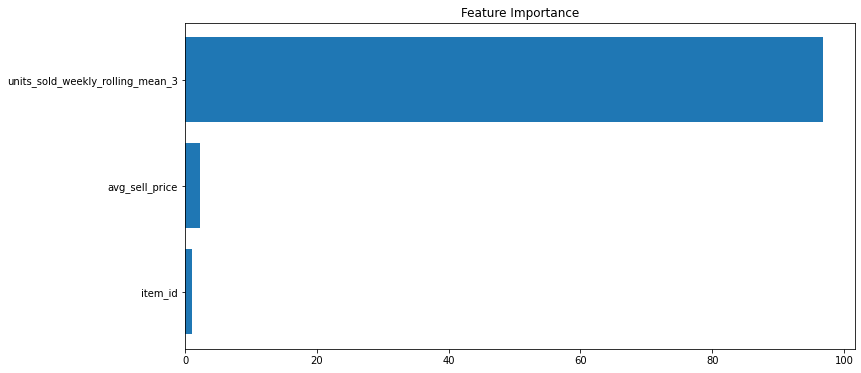

In [159]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)

fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_train.columns)[sorted_idx])
plt.title('Feature Importance')

In [167]:
ids = train.item_id.unique()
window=3
output = []
skipped = []

for ID in ids:

    X_test['weekly_rolling_mean_'+str(window)] = 0

    X_test_single = X_test[X_test['item_id']==ID].reset_index().drop(columns='index')

    valid_single = valid[valid['item_id']==ID]

    x = X_test_single.iloc[[0]]
    x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
    X_test_single = X_test_single.drop(index=0)
    X_test_single = pd.concat([x,X_test_single])
    
    if valid_single.shape[0] < window or X_test_single.shape[0] < window + 1:
        
        skipped.append(ID)
        
    else:

        y_pred = []

        for i in range(0,window):

            x = X_test_single.iloc[[i]]

            if i!=0:
                x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window

            y = model.predict(x)[0]
            y_pred.append(y)

            prev_sales = valid_single.tail(window-(i+1))['units_sold'].to_numpy()

        rows = X_test_single.shape[0]

        for i in range(window,rows):
            x = X_test_single.iloc[[i]]
            x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
            y = model.predict(x)[0]
            y_pred.append(y)

        single_item_actuals_df = test_df[test_df['item_id']==ID]
        y_actual = single_item_actuals_df['units_sold'].to_numpy()

        naive_window = 6

        y_naive = valid_single.tail(naive_window).units_sold.mean()*np.ones(len(y_actual))

        y_pred_MSE = round(mean_squared_error(y_actual,y_pred),3)
        y_naive_MSE = round(mean_squared_error(y_actual,y_naive),3)

        if y_pred_MSE < y_naive_MSE:
            output.append(ID)

output

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a co

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a co

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a co

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a co

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a co

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['weekly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\2496256463.py:43: SettingWithCopyWarning: 
A value is trying to be s

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 18,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 31,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99]

In [168]:
len(output)/(len(ids)-len(skipped))

0.93

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

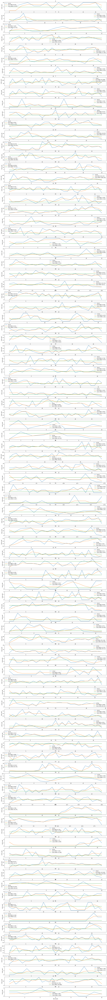

In [162]:
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages('plots.pdf')

plot_rows = len(output)
fig, ax = plt.subplots(nrows=plot_rows,ncols=1,figsize = (20,200))

counter = 0

for ID in output:

    X_test['monthly_rolling_mean_'+str(window)] = 0

    X_test_single = X_test[X_test['item_id']==ID].reset_index().drop(columns='index')

    valid_single = valid[valid['item_id']==ID]

    x = X_test_single.iloc[[0]]
    x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
    X_test_single = X_test_single.drop(index=0)
    X_test_single = pd.concat([x,X_test_single])

    y_pred = []

    for i in range(0,window):

        x = X_test_single.iloc[[i]]

        if i!=0:
            x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window

        y = model.predict(x)[0]
        y_pred.append(y)

        prev_sales = valid_single.tail(window-(i+1))['units_sold'].to_numpy()

    rows = X_test_single.shape[0]

    for i in range(window,rows):
        x = X_test_single.iloc[[i]]
        x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
        y = model.predict(x)[0]
        y_pred.append(y)

    single_item_actuals_df = test_df[test_df['item_id']==ID]
    y_actual = single_item_actuals_df['units_sold'].to_numpy()

    naive_window = 6

    y_naive = valid_single.tail(naive_window).units_sold.mean()*np.ones(len(y_actual))

    y_pred_MSE = round(mean_squared_error(y_actual,y_pred),3)
    y_naive_MSE = round(mean_squared_error(y_actual,y_naive),3)
    
    ax[counter].set_title(ID)
    ax[counter].set_xlabel('Test month')
    ax[counter].set_ylabel('Units sold')

    ax[counter].plot(y_actual,label='actual')
    ax[counter].plot(y_pred,label='pred (MSE='+str(y_pred_MSE)+')')
    ax[counter].plot(y_naive,label='naive (MSE='+str(y_naive_MSE)+')')

    ax[counter].legend()
    
    counter += 1

pp.savefig(fig)
pp.close()

In [163]:
ids = train.item_id.unique()
window=2
output = []
skipped = []

for ID in ids:

    X_test['monthly_rolling_mean_'+str(window)] = 0

    X_test_single = X_test[X_test['item_id']==ID].reset_index().drop(columns='index')

    valid_single = valid[valid['item_id']==ID]

    x = X_test_single.iloc[[0]]
    x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
    X_test_single = X_test_single.drop(index=0)
    X_test_single = pd.concat([x,X_test_single])
    
    if valid_single.shape[0] < window or X_test_single.shape[0] < window + 1:
        
        skipped.append(ID)
        
    else:

        y_pred = []

        for i in range(0,window):

            x = X_test_single.iloc[[i]]

            if i!=0:
                x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window

            y = model.predict(x)[0]
            y_pred.append(y)

            prev_sales = valid_single.tail(window-(i+1))['units_sold'].to_numpy()

        rows = X_test_single.shape[0]

        for i in range(window,rows):
            x = X_test_single.iloc[[i]]
            x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
            y = model.predict(x)[0]
            y_pred.append(y)

        single_item_actuals_df = test_df[test_df['item_id']==ID]
        y_actual = single_item_actuals_df['units_sold'].to_numpy()

        naive_window = 6

        y_naive = valid_single.tail(naive_window).units_sold.mean()*np.ones(len(y_actual))

        y_pred_MSE = round(mean_squared_error(y_actual,y_pred),3)
        y_naive_MSE = round(mean_squared_error(y_actual,y_naive),3)

        if y_pred_MSE < y_naive_MSE:
            output.append(ID)

output

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\957601384.py:43: SettingWithCopyWarning: 
A value is trying to be se

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 18,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 31,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99]

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a c

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

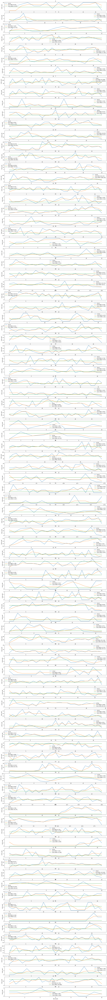

In [164]:
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages('plots.pdf')

plot_rows = len(output)
fig, ax = plt.subplots(nrows=plot_rows,ncols=1,figsize = (20,200))

counter = 0

for ID in output:

    X_test['monthly_rolling_mean_'+str(window)] = 0

    X_test_single = X_test[X_test['item_id']==ID].reset_index().drop(columns='index')

    valid_single = valid[valid['item_id']==ID]

    x = X_test_single.iloc[[0]]
    x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
    X_test_single = X_test_single.drop(index=0)
    X_test_single = pd.concat([x,X_test_single])

    y_pred = []

    for i in range(0,window):

        x = X_test_single.iloc[[i]]

        if i!=0:
            x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window

        y = model.predict(x)[0]
        y_pred.append(y)

        prev_sales = valid_single.tail(window-(i+1))['units_sold'].to_numpy()

    rows = X_test_single.shape[0]

    for i in range(window,rows):
        x = X_test_single.iloc[[i]]
        x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
        y = model.predict(x)[0]
        y_pred.append(y)

    single_item_actuals_df = test_df[test_df['item_id']==ID]
    y_actual = single_item_actuals_df['units_sold'].to_numpy()

    naive_window = 6

    y_naive = valid_single.tail(naive_window).units_sold.mean()*np.ones(len(y_actual))

    y_pred_MSE = round(mean_squared_error(y_actual,y_pred),3)
    y_naive_MSE = round(mean_squared_error(y_actual,y_naive),3)
    
    ax[counter].set_title(ID)
    ax[counter].set_xlabel('Test month')
    ax[counter].set_ylabel('Units sold')

    ax[counter].plot(y_actual,label='actual')
    ax[counter].plot(y_pred,label='pred (MSE='+str(y_pred_MSE)+')')
    ax[counter].plot(y_naive,label='naive (MSE='+str(y_naive_MSE)+')')

    ax[counter].legend()
    
    counter += 1

pp.savefig(fig)
pp.close()

In [165]:
ids = train.item_id.unique()
window=7
output = []
skipped = []

for ID in ids:

    X_test['monthly_rolling_mean_'+str(window)] = 0

    X_test_single = X_test[X_test['item_id']==ID].reset_index().drop(columns='index')

    valid_single = valid[valid['item_id']==ID]

    x = X_test_single.iloc[[0]]
    x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
    X_test_single = X_test_single.drop(index=0)
    X_test_single = pd.concat([x,X_test_single])
    
    if valid_single.shape[0] < window or X_test_single.shape[0] < window + 1:
        
        skipped.append(ID)
        
    else:

        y_pred = []

        for i in range(0,window):

            x = X_test_single.iloc[[i]]

            if i!=0:
                x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window

            y = model.predict(x)[0]
            y_pred.append(y)

            prev_sales = valid_single.tail(window-(i+1))['units_sold'].to_numpy()

        rows = X_test_single.shape[0]

        for i in range(window,rows):
            x = X_test_single.iloc[[i]]
            x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
            y = model.predict(x)[0]
            y_pred.append(y)

        single_item_actuals_df = test_df[test_df['item_id']==ID]
        y_actual = single_item_actuals_df['units_sold'].to_numpy()

        naive_window = 6

        y_naive = valid_single.tail(naive_window).units_sold.mean()*np.ones(len(y_actual))

        y_pred_MSE = round(mean_squared_error(y_actual,y_pred),3)
        y_naive_MSE = round(mean_squared_error(y_actual,y_naive),3)

        if y_pred_MSE < y_naive_MSE:
            output.append(ID)

output

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\164519537.py:43: SettingWithCopyWarning: 
A value is trying to be se

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 18,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 31,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99]

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a c

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a 

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window
C:\Users\sarth\AppData\Local\Temp\ipykernel_9656\3028597011.py:41: SettingWithCopyWarning: 
A value is trying to be

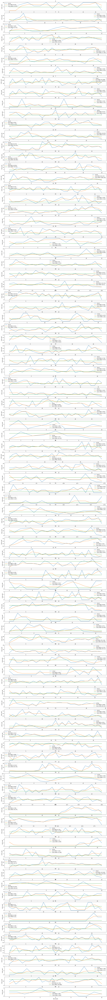

In [166]:
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages('plots.pdf')

plot_rows = len(output)
fig, ax = plt.subplots(nrows=plot_rows,ncols=1,figsize = (20,200))

counter = 0

for ID in output:

    X_test['monthly_rolling_mean_'+str(window)] = 0

    X_test_single = X_test[X_test['item_id']==ID].reset_index().drop(columns='index')

    valid_single = valid[valid['item_id']==ID]

    x = X_test_single.iloc[[0]]
    x['monthly_rolling_mean_'+str(window)] = valid_single.tail(window).units_sold.mean()
    X_test_single = X_test_single.drop(index=0)
    X_test_single = pd.concat([x,X_test_single])

    y_pred = []

    for i in range(0,window):

        x = X_test_single.iloc[[i]]

        if i!=0:
            x['monthly_rolling_mean_'+str(window)] = ( prev_sales.sum() + np.sum(y_pred) )/window

        y = model.predict(x)[0]
        y_pred.append(y)

        prev_sales = valid_single.tail(window-(i+1))['units_sold'].to_numpy()

    rows = X_test_single.shape[0]

    for i in range(window,rows):
        x = X_test_single.iloc[[i]]
        x['monthly_rolling_mean_'+str(window)] = np.sum(y_pred[i-window:i])/window
        y = model.predict(x)[0]
        y_pred.append(y)

    single_item_actuals_df = test_df[test_df['item_id']==ID]
    y_actual = single_item_actuals_df['units_sold'].to_numpy()

    naive_window = 6

    y_naive = valid_single.tail(naive_window).units_sold.mean()*np.ones(len(y_actual))

    y_pred_MSE = round(mean_squared_error(y_actual,y_pred),3)
    y_naive_MSE = round(mean_squared_error(y_actual,y_naive),3)
    
    ax[counter].set_title(ID)
    ax[counter].set_xlabel('Test month')
    ax[counter].set_ylabel('Units sold')

    ax[counter].plot(y_actual,label='actual')
    ax[counter].plot(y_pred,label='pred (MSE='+str(y_pred_MSE)+')')
    ax[counter].plot(y_naive,label='naive (MSE='+str(y_naive_MSE)+')')

    ax[counter].legend()
    
    counter += 1

pp.savefig(fig)
pp.close()